# Integrate All ten datasets in one Visualization (~500k cells)

### Import modules, set paths, load files:

In [1]:
# !pip install scanpy
# !pip install ipywidgets
import scanpy as sc
import anndata
import numpy as np
import pandas as pd
import os

from tqdm import tqdm

In [2]:
# !pip install scarches
# !pip install -U pandas==2.0

import scarches as sca

 captum (see https://github.com/pytorch/captum).


In [3]:
# https://github.com/huggingface/transformers/issues/29763
# pip install transformers==4.37.2
import torch

In [4]:
import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=UserWarning)

## Import the cell type information from the CSV file

And also normalized the data

In [8]:
def import_cell_type(filename_csv, filename_h5ad):
    df_adata = pd.read_csv(filename_csv, index_col=0)
    path_input_data = filename_h5ad
    reference_adata = sc.read(path_input_data)

    list_cells = reference_adata.obs.index.tolist()
    list_cell_types = []

    error_counts = 0
    error_label = 'ERROR'

    for i in tqdm(range(len(list_cells))):
        index_example = list_cells[i]
        try:
            cell_type_example = df_adata.loc[index_example, 'CL_Label']
            list_cell_types.append(cell_type_example)
        except:
            error_counts += 1
            list_cell_types.append(error_label)

    print('Error count is:', error_counts)
    # list_cell_types
    print('Error percentage is:', error_counts*100/len(list_cells),'%')

    reference_adata.obs["cell_type"] = list_cell_types

    # choose layers

    reference_adata.X = reference_adata.layers["spliced_unspliced_sum"]
 
    # UCE load fix, suggested from Yingnan Ju
    # Replace NaN values in the 'hugo_symbol' column with a placeholder
    placeholder = "Unknown"

    # Convert 'category' column to categorical
    reference_adata.var['hugo_symbol'] = reference_adata.var['hugo_symbol'].astype('category')

    # Add new category 'Unknown' dynamically
    reference_adata.var['hugo_symbol'] = reference_adata.var['hugo_symbol'].cat.add_categories([placeholder])

    # Now you can safely assign 'Unknown' to the column
    reference_adata.var['hugo_symbol'].fillna(placeholder, inplace=True)
    
#     # Ensure 'hugo_symbol' is treated as a categorical column
#     reference_adata.var['hugo_symbol'] = reference_adata.var['hugo_symbol'].astype('category')

#     # Add the placeholder as a new category
#     reference_adata.var['hugo_symbol'].cat.add_categories([placeholder], inplace=True)

#     # Replace NaN values with the placeholder
#     reference_adata.var['hugo_symbol'].fillna(placeholder, inplace=True)

#     # Save the adjusted AnnData
# #     adata.write(NEW_H5AD_FILE_LOCATION)
    

    return reference_adata

In [ ]:
filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_853-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_853.h5ad'
reference_adata_1 = import_cell_type(filename_csv, filename_h5ad)

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_986-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_986.h5ad'
reference_adata_2 = import_cell_type(filename_csv, filename_h5ad)

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_369-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_369.h5ad'
reference_adata_3 = import_cell_type(filename_csv, filename_h5ad)

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_282-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_282.h5ad'
reference_adata_4 = import_cell_type(filename_csv, filename_h5ad)

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_672-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_672.h5ad'
reference_adata_5 = import_cell_type(filename_csv, filename_h5ad)

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_258-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_258.h5ad'
reference_adata_6 = import_cell_type(filename_csv, filename_h5ad)

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_633-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_633.h5ad'
reference_adata_7 = import_cell_type(filename_csv, filename_h5ad)

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_384-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_384.h5ad'
reference_adata_8 = import_cell_type(filename_csv, filename_h5ad)

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_643-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_643.h5ad'
reference_adata_9 = import_cell_type(filename_csv, filename_h5ad)

filename_csv = '/home/fanhuan/data/BioInfo/453k/expr_967-annotations.csv'
filename_h5ad = '/home/fanhuan/data/BioInfo/453k/expr_967.h5ad'
reference_adata_10 = import_cell_type(filename_csv, filename_h5ad)

In [ ]:
ann_data_list = [reference_adata_1, reference_adata_2, reference_adata_3, reference_adata_4
                              , reference_adata_5, reference_adata_6, reference_adata_7, reference_adata_8
                              , reference_adata_9, reference_adata_10]

In [ ]:
combined_ann_data = ann_data_list[0].concatenate(ann_data_list[1:])

In [ ]:
sc.pp.filter_cells(combined_ann_data, min_genes=200)
sc.pp.filter_genes(combined_ann_data, min_cells=3)
sc.pp.normalize_total(combined_ann_data, target_sum=1e4)
sc.pp.log1p(combined_ann_data)
sc.pp.highly_variable_genes(combined_ann_data, n_top_genes=2000)

In [ ]:
adata_concat = combined_ann_data
adata_concat

In [14]:
sc.pp.neighbors(adata_concat)
sc.tl.umap(adata_concat)

         Falling back to preprocessing with `sc.pp.pca` and default params.


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


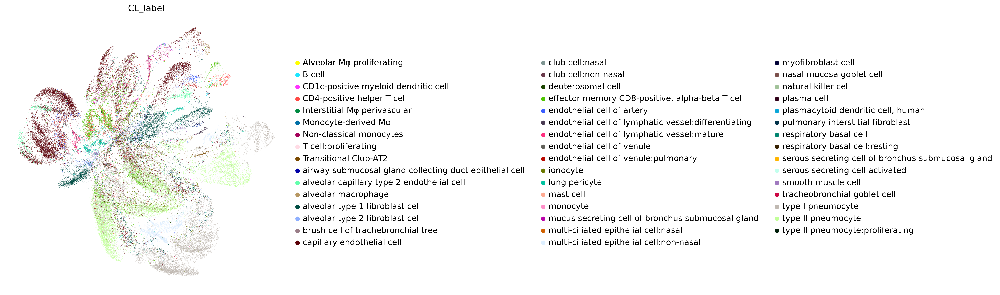

In [15]:
sc.pl.umap(adata_concat, color=['CL_label'], wspace=0.5, frameon=False)

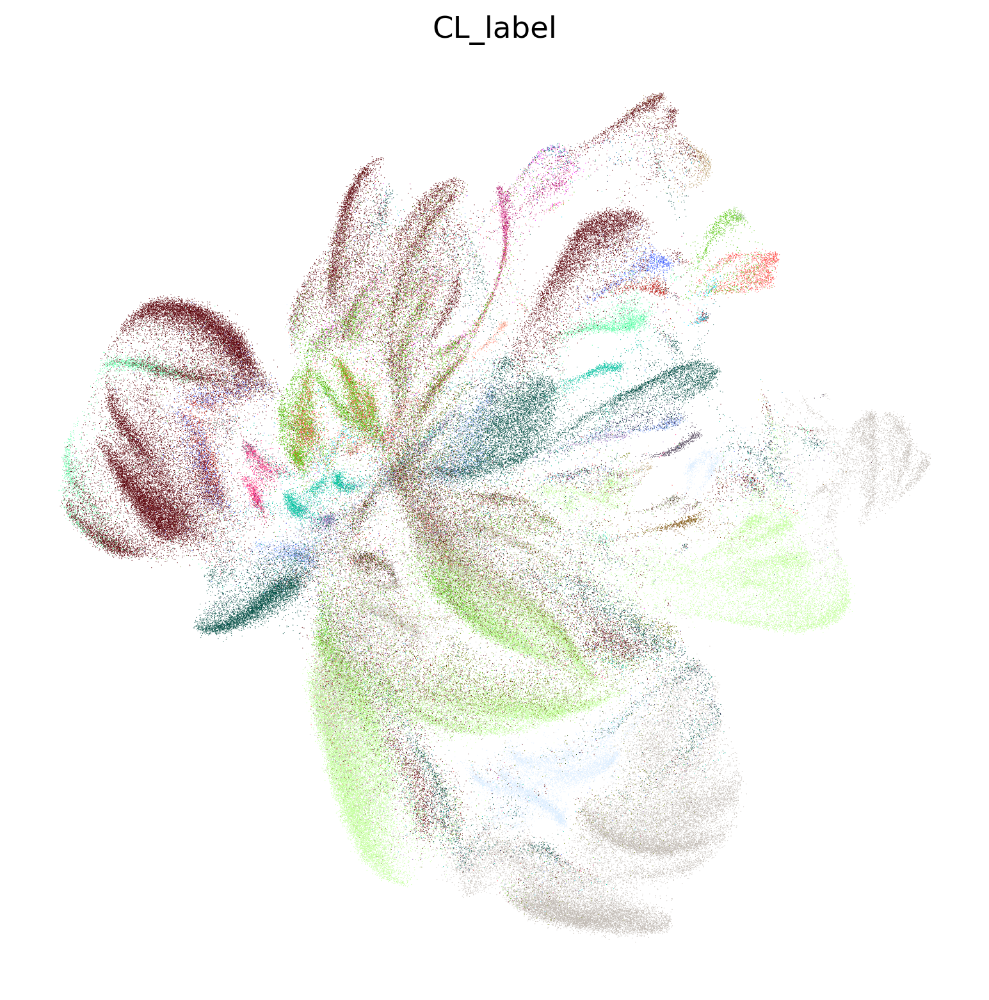

In [16]:
sc.pl.umap(adata_concat, color=['CL_label'], frameon=False, legend_loc = 'best')

# UCE model

https://github.com/snap-stanford/UCE

## Run on full dataset

In [68]:
adata_concat.write_h5ad(
    '/home/fanhuan/data/BioInfo/453k/all-with_annotation-processed.h5ad'
)

In [ ]:
path_to_anndata = '/home/fanhuan/data/BioInfo/453k/all-with_annotation-processed.h5ad'
output_dir = '/home/fanhuan/data/BioInfo/453k/all-with_annotation-processed-UCE.h5ad'
model_loc = '/home/fanhuan/data/BioInfo/cache/UCE/4layer_model.torch'

!python UCE-main/eval_single_anndata.py --adata_path $path_to_anndata --dir $output_dir --species 'human' --model_loc $model_loc --batch_size 25

Proccessing all-with_annotation-processed


!python eval_single_anndata.py --adata_path '/home/fanhuan/data/BioInfo/453k/all-with_annotation-processed.h5ad' --dir '/home/fanhuan/data/BioInfo/453k/all-with_annotation-processed-UCE.h5ad' --species 'human' --model_loc '/home/fanhuan/data/BioInfo/cache/UCE/4layer_model.torch' --batch_size 25

!python eval_single_anndata.py --adata_path '/home/fanhuan/data/BioInfo/453k/all-with_annotation-processed.h5ad' --dir '/home/fanhuan/data/BioInfo/453k/UCE_results/better_model/' --species 'human' --model_loc '/home/fanhuan/data/BioInfo/cache/UCE/33l_8ep_1024t_1280.torch' --batch_size 25 --nlayers 33

# UCE approach based UMAP visualization

## 4-layer UCE model

In [11]:
path_input_data = '/home/fanhuan/data/BioInfo/453k/UCE_results/simple_model/all-with_annotation-processed-UCE.h5adall-with_annotation-processed_uce_adata.h5ad'
simple_UCE = sc.read(path_input_data)
simple_UCE

AnnData object with n_obs × n_vars = 259531 × 16445
    obs: 'cell_type', 'batch', 'n_genes'
    var: 'hugo_symbol', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'log1p'
    obsm: 'X_uce'
    layers: 'spliced', 'spliced_unspliced_sum', 'unspliced'

In [11]:
sc.pp.neighbors(simple_UCE, use_rep = 'X_uce')
sc.tl.umap(simple_UCE)

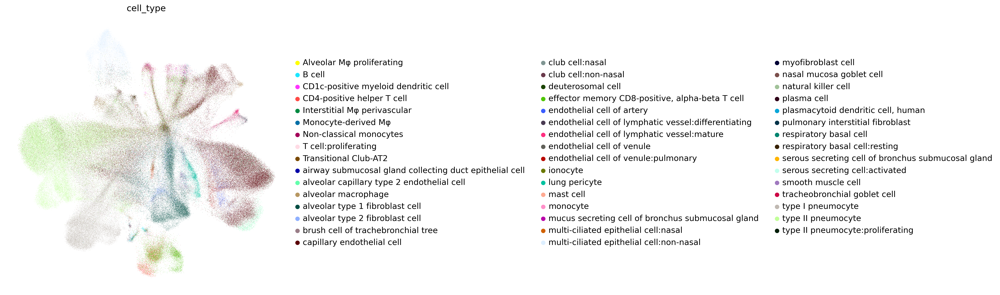

In [15]:
sc.pl.umap(simple_UCE, color=['cell_type'], wspace=0.5, frameon=False)

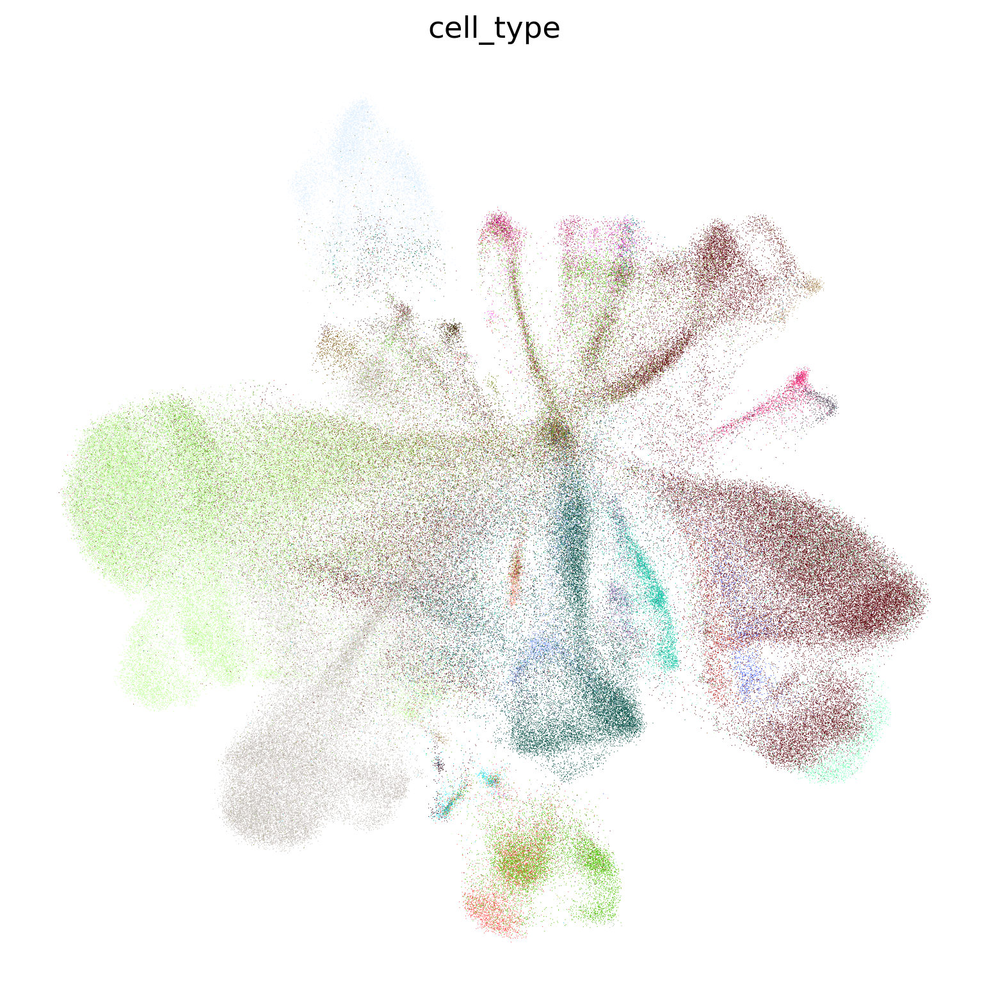

In [16]:
sc.pl.umap(simple_UCE, color=['cell_type'], frameon=False, legend_loc = 'best')

## 33-layer UCE model

In [6]:
path_input_data = '/home/fanhuan/data/BioInfo/453k/UCE_results/better_model/all-with_annotation-processed_uce_adata.h5ad'
better_UCE = sc.read(path_input_data)
better_UCE

AnnData object with n_obs × n_vars = 259531 × 16445
    obs: 'cell_type', 'batch', 'n_genes'
    var: 'hugo_symbol', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'log1p'
    obsm: 'X_uce'
    layers: 'spliced', 'spliced_unspliced_sum', 'unspliced'

In [13]:
sc.pp.neighbors(better_UCE, use_rep = 'X_uce')
sc.tl.umap(better_UCE)

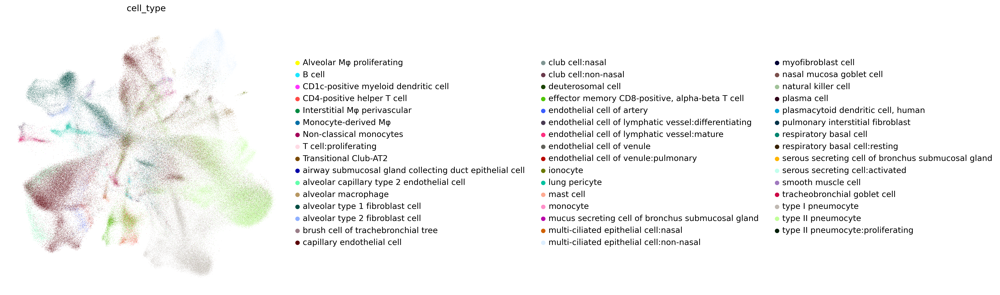

In [14]:
sc.pl.umap(better_UCE, color=['cell_type'], wspace=0.5, frameon=False)

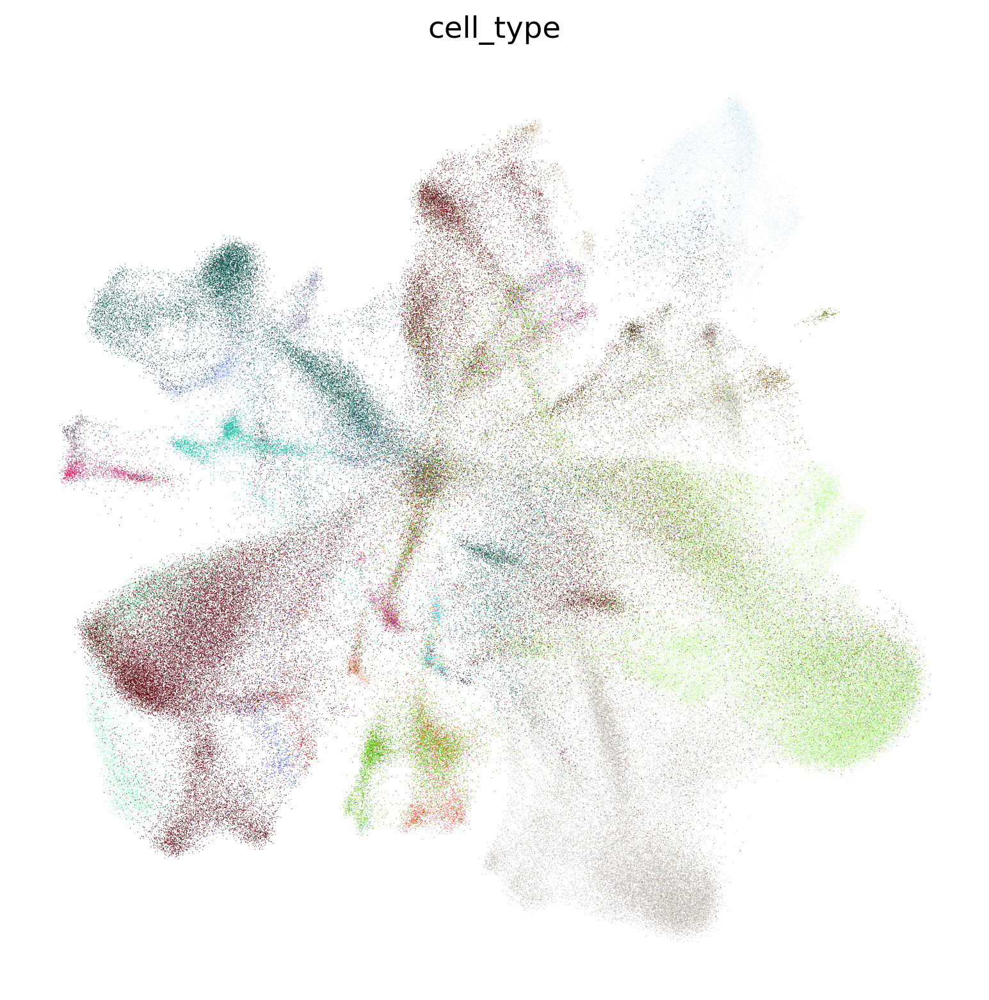

In [15]:
sc.pl.umap(better_UCE, color=['cell_type'], frameon=False, legend_loc = 'best')